<p>
    <a href="https://umt.edu.al/en/anxhelo-shehu/" target="_blank">
    <img src="https://umt.edu.al/wp-content/uploads/2022/10/Anxhelo-Shehu-min-2-300x300.jpg" width="150" alt="UMT Logo">
    </a>
</p>
<p>
    <a href="https://umt.edu.al/" target="_blank">
    <img src="https://umt.edu.al/wp-content/uploads/2024/11/Universiteti-Metropolitan-Tirana.webp" width="200" alt="UMT Logo">
    </a>
</p>

<h1> Filtrimi në Fushën e frekuencës: </h1>

Koha e nevojshme per kete Lab: **+120** minuta


- **<h2> Transformimi Furier </h2>**
- **<h2> Filtrimi në Fushën e Frekuencave (e Transformimit Fourier (TF)) </h2>**

## Transformimi Furier

Transformimi Furier është një teknikë matematikore që përdoret për të analizuar sinjalet në domenin e frekuencës. Në përpunimin e imazheve, ai lejon shndërrimin e një imazhi nga domeni hapësinor në domenin e frekuencës, duke ndihmuar në identifikimin e përbërësve të ndryshëm të frekuencës që përmban imazhi. Kjo analizë është veçanërisht e dobishme për detektimin e strukturave periodike ose për manipulimin e informacionit të fshehur në frekuenca të ndryshme.

## Filtrimi në Fushën e Transformimit Fourier (TF)

Filtrimi në domenin e Transformimit Fourier nënkupton aplikimin e filtrave të ndryshëm (si filtrat e frekuencës së lartë apo të ulët) mbi versionin e transformuar të imazhit. Ky proces lejon përmirësimin ose reduktimin e veçorive të caktuara të imazhit, si zbutja e zhurmës apo theksimi i kufijve. Pas filtrimit, imazhi rikthehet në domenin hapësinor me anë të transformimit Furier të kundërt.


Shkarkojme  disa nga imazhet e nevojshme per kete laborator


In [26]:
import requests

# URLs per imazhet
urls = [
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cameraman.jpeg"
]

# Shkarkojme edhe ruajm imazhet duke perdorur URL perkatese
for url in urls:
    response = requests.get(url)
    if response.status_code == 200:
        filename = url.split("/")[-1]
        with open(filename, 'wb') as file:
            file.write(response.content)
        print(f"Downloaded: {filename}")
    else:
        print(f"Failed to download: {url}")

Downloaded: lenna.png
Downloaded: barbara.png
Downloaded: cameraman.jpeg


Ne importojme librarit e nevojshme

In [27]:
# Përdoret për të shfaqur imazhet
import matplotlib.pyplot as plt
# Përdoret për të ngarkuar një imazh
from PIL import Image
# Përdoret për të krijuar bërthama për filtrimin
import numpy as np


Kjo funksion do të paraqesë dy imazhe krah për krah njeri-tjetrit per krahasim

In [28]:
def plot_image(image_1, image_2,title_1="Orignal",title_2="New Image", gray = "yes or no"):
    if gray == "no":
        plt.figure(figsize=(10,10))
        plt.subplot(1, 2, 1)
        plt.imshow(image_1)
        plt.title(title_1)
        plt.subplot(1, 2, 2)
        plt.imshow(image_2)
        plt.title(title_2)
        plt.show()
    else:
        plt.figure(figsize=(10,10))
        plt.subplot(1, 2, 1)
        plt.imshow(image_1, 'gray')
        plt.title(title_1)
        plt.subplot(1, 2, 2)
        plt.imshow(image_2, 'gray')
        plt.title(title_2)
        plt.show()

### Transformimi Furie i një sinjali

- **`np.fft.fft()`**  
  Ky funksion llogarit Transformimin e Shpejtë të Furie-s (Fast Fourier Transform – FFT).  
  Në thelb, ai shndërron sinjalin nga **domena e kohës** në **domenën e frekuencës**.  
  Pra, në vend që sinjali të përshkruhet si ndryshim në kohë, ai përfaqësohet si një kombinim i frekuencave të ndryshme (valë sinusoidale).  
  Rezultati është një vektor kompleks që tregon:
  - cilat frekuenca janë të pranishme në sinjal  
  - sa e fortë është secila frekuencë (magnituda)  
  - dhe faza e tyre  

- **`np.fft.fftfreq()`**  
  Ky funksion gjeneron vlerat e frekuencave që korrespondojnë me rezultatin e FFT-së.  
  Ai tregon se **çfarë frekuence përfaqëson secili element** i daljes së `fft()`.  
  Në këtë mënyrë, mund të lidhim çdo vlerë të transformimit me një frekuencë konkrete (p.sh. 5 Hz, 20 Hz, etj.), duke e bërë të mundur interpretimin fizik të sinjalit në domenën e frekuencës.


In [29]:

fs = 500  # sampling frequency (Hz)
t = np.linspace(0, 1, fs, endpoint=False)

# sinjal me dy frekuenca: 5 Hz dhe 20 Hz
signal = np.sin(2 * np.pi * 5 * t) + 0.5 * np.sin(2 * np.pi * 20 * t)

# Fourier Transform

fft_vals = np.fft.fft(signal)
fft_freq = np.fft.fftfreq(len(signal), 1/fs)

# marrim vetëm pjesën pozitive
positive_freqs = fft_freq[:len(fft_freq)//2]
magnitude = np.abs(fft_vals[:len(fft_vals)//2])

In [30]:
for i in range(5):
    print(f'D.Kohe: {signal[i]},  D.Frekuence: {fft_vals[i]}, ,  Frekuenca: {fft_freq[i]}')


D.Kohe: 0.0,  D.Frekuence: (-2.1844794946391613e-14+0j), ,  Frekuenca: 0.0
D.Kohe: 0.18713546311174079,  D.Frekuence: (3.9414618110222897e-14+3.774758283725532e-15j), ,  Frekuenca: 1.0
D.Kohe: 0.3662100706151619,  D.Frekuence: (5.2135405799443575e-15+5.577517484303567e-14j), ,  Frekuenca: 2.0
D.Kohe: 0.529654867550069,  D.Frekuence: (-9.419888349015434e-16-6.52811138479592e-14j), ,  Frekuenca: 3.0
D.Kohe: 0.6708538499158623,  D.Frekuence: (4.470145275232192e-14+6.815833613356756e-14j), ,  Frekuenca: 4.0


In [64]:
# imazh 3x3
image = np.array([[1, 2, 3],
                  [4, 5, 6],
                  [7, 8, 9]])

# FFT 2D
fft_image = np.fft.fft2(image)

# Llogarit fazën
phase = np.angle(fft_image)  # angle në radianë

# Print vlerat
print("Imazh origjinal:\n", image)
print("\nFFT 2D (kompleks):\n", fft_image)
print("\nMagnitude (moduli):\n", np.abs(fft_image))
print("\nFaza (radianë):\n", phase)

Imazh origjinal:
 [[1 2 3]
 [4 5 6]
 [7 8 9]]

FFT 2D (kompleks):
 [[ 45. +0.j          -4.5+2.59807621j  -4.5-2.59807621j]
 [-13.5+7.79422863j   0. +0.j           0. +0.j        ]
 [-13.5-7.79422863j   0. +0.j           0. +0.j        ]]

Magnitude (moduli):
 [[45.          5.19615242  5.19615242]
 [15.58845727  0.          0.        ]
 [15.58845727  0.          0.        ]]

Faza (radianë):
 [[ 0.          2.61799388 -2.61799388]
 [ 2.61799388  0.          0.        ]
 [-2.61799388  0.          0.        ]]


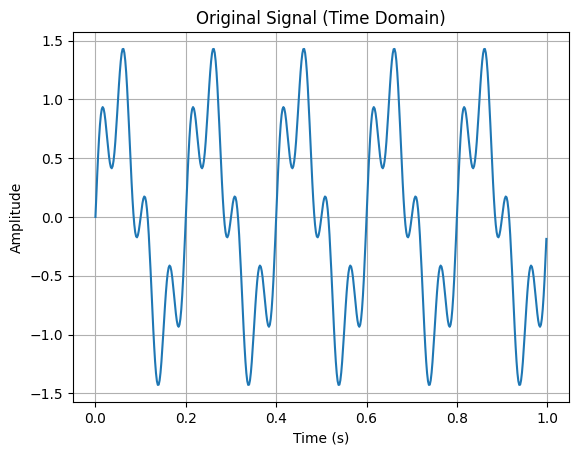

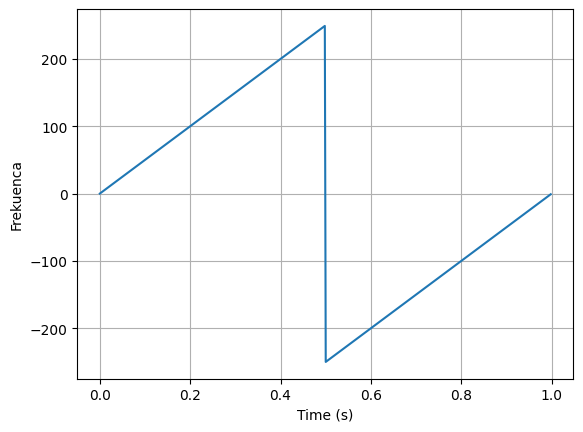

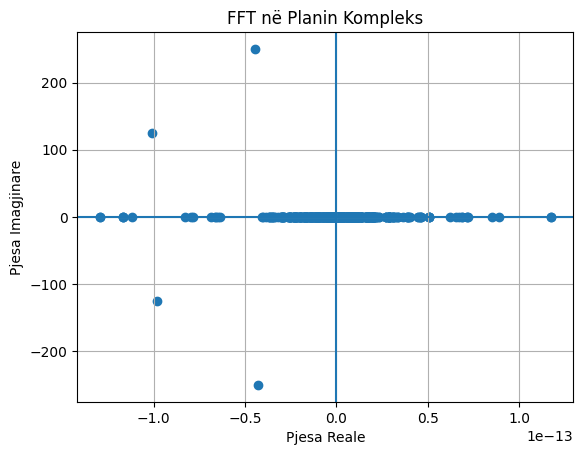

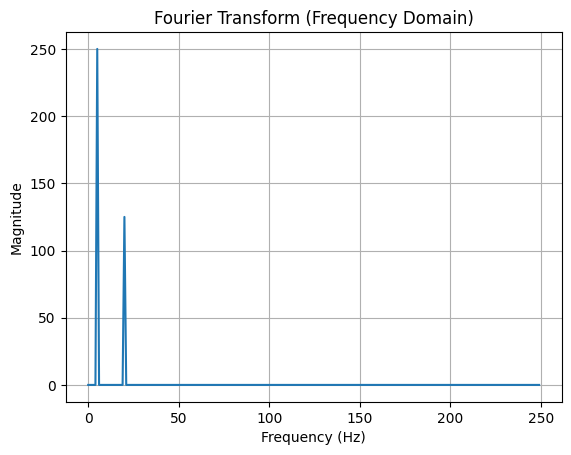

In [31]:
# Plot i sinjalit në kohë
plt.figure()
plt.plot(t, signal)
plt.title("Original Signal (Time Domain)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid()
plt.show()

# Plot i frekuencave
plt.figure()
plt.plot(t, fft_freq)
plt.xlabel("Time (s)")
plt.ylabel("Frekuenca")
plt.grid()
plt.show()

# Plot në planin kompleks (Real vs Imaginary)

plt.figure()
plt.scatter(np.real(fft_vals), np.imag(fft_vals))
plt.title("FFT në Planin Kompleks")
plt.xlabel("Pjesa Reale")
plt.ylabel("Pjesa Imagjinare")

plt.axhline(0)  # boshti horizontal
plt.axvline(0)  # boshti vertikal

plt.grid()
plt.show()

# Plot i Fourier Transform

plt.figure()
plt.plot(positive_freqs, magnitude)
plt.title("Fourier Transform (Frequency Domain)")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.grid()
plt.show()

In [32]:
# =====================================================
# 5. Fourier Series Coefficients
# =====================================================

N = len(signal)

# Koeficientët kompleks të Serisë Furie
c_k = fft_vals / N

# Marrim vetëm frekuencat pozitive
freqs = fft_freq[:N//2]
coeffs = c_k[:N//2]

# =====================================================
# 6. Printojmë komponentët kryesorë
# =====================================================

print("\nFourier Series Coefficients (dominant frequencies):")
print("--------------------------------------------------")

for i in range(len(freqs)):
    if np.abs(coeffs[i]) > 0.01:  # filtrojmë vetëm komponentët e rëndësishëm
        print(f"Frequency: {freqs[i]:.2f} Hz | Amplitude: {np.abs(coeffs[i]):.4f}")


Fourier Series Coefficients (dominant frequencies):
--------------------------------------------------
Frequency: 5.00 Hz | Amplitude: 0.5000
Frequency: 20.00 Hz | Amplitude: 0.2500


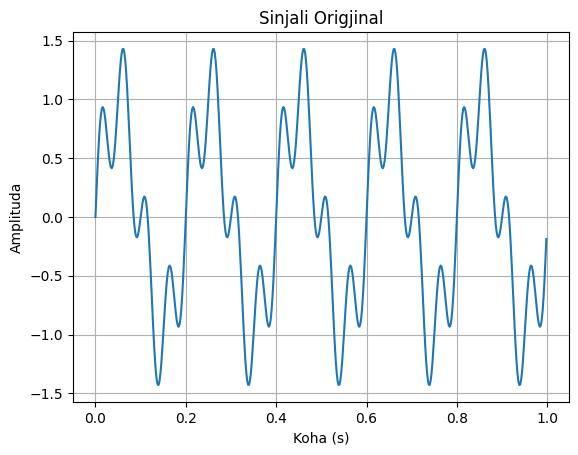

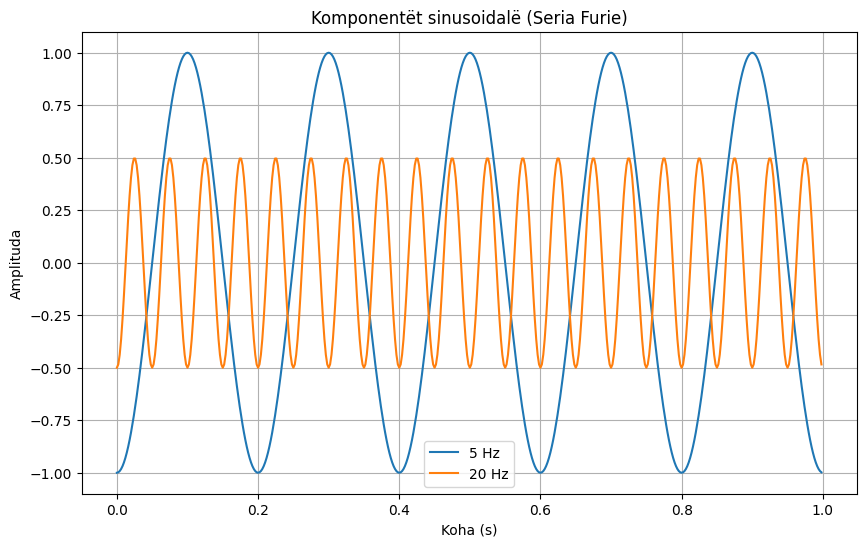

In [33]:
components = []

for i in range(N):
    amp = 2 * np.abs(c_k[i])  # amplituda reale
    freq = fft_freq[i]
    phase = np.angle(c_k[i])

    if amp > 0.1 and freq > 0:  # filtrojmë vetëm komponentët kryesorë pozitivë
        comp = amp * np.sin(2 * np.pi * freq * t + phase)
        components.append((freq, comp))

# Plot sinjali origjinal
plt.figure()
plt.plot(t, signal)
plt.title("Sinjali Origjinal")
plt.xlabel("Koha (s)")
plt.ylabel("Amplituda")
plt.grid()
plt.show()

# Plot çdo komponent i Serisë Furie

plt.figure(figsize=(10, 6))

for i, (freq, comp) in enumerate(components):
    plt.plot(t, comp, label=f"{freq:.0f} Hz")

plt.title("Komponentët sinusoidalë (Seria Furie)")
plt.xlabel("Koha (s)")
plt.ylabel("Amplituda")
plt.legend()
plt.grid()
plt.show()

## Aliasingu


**Çfarë është Aliasing në imazhe?**

- Aliasing është një fenomen që ndodh kur një imazh përmban detaje me frekuencë të lartë (si linja shumë të holla ose tekstura të imta), dhe këto detaje nuk mund të përfaqësohen saktë gjatë procesit të digitalizimit ose zvogëlimit të imazhit.

Rezultati është krijimi i artefakteve të padëshiruara, si:

-- **1** Valëzime të çuditshme (moire)

-- **2** Konture të shtrembëruara

-- **3** Modele të rreme që nuk ekzistojnë në origjinal

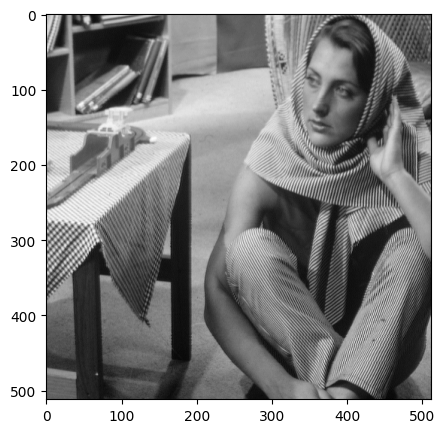

In [34]:
# ngarkojme imazhin nga pathi perkates
image = Image.open("barbara.png")
# lexojme imazhin dhe e shfaqim ate
plt.figure(figsize=(5,5))
plt.imshow(image, 'gray')
plt.show()

ImageFilter.BoxBlur(1) në Pillow
Ky është një filtër turbullimi (blur filter) i implementuar në bibliotekën Pillow (PIL) që përdor një filtër mesatarizues (average filter) mbi secilën piksel të imazhit.

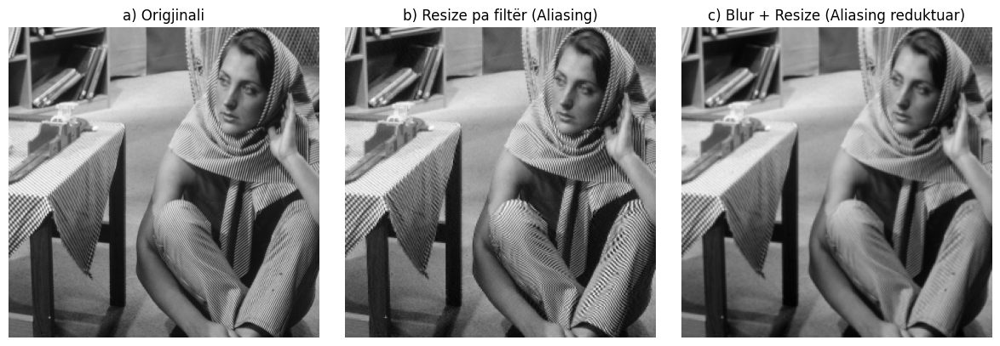

In [35]:
from PIL import ImageFilter

# Ngarko imazhin origjinal dhe e lexojme ate si bardh e zi
img = Image.open("barbara.png").convert("L")  # L për grayscale

# (a) Imazhi origjinal
original = img.copy()

# (b) Resize në 50% pa anti-aliasing (heqje pikseli - nearest neighbor)
downsampled_aliasing = img.resize(
    (img.width // 2, img.height // 2), resample=Image.NEAREST
)

# (c) Blur me filtër mesatar 3x3, pastaj resize

blurred = img.filter(ImageFilter.BoxBlur(1))  # Filtër mesatar me dim 3x3
downsampled_blurred = blurred.resize(
    (img.width // 2, img.height // 2), resample=Image.NEAREST
)

# Vizualizim i rezultateve ne nje dritare 12x4
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.title("a) Origjinali")
plt.imshow(original, cmap="gray")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("b) Resize pa filtër (Aliasing)")
plt.imshow(downsampled_aliasing, cmap="gray")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("c) Blur + Resize (Aliasing reduktuar)")
plt.imshow(downsampled_blurred, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()


In [36]:
print(f"(a) Dimensionet e origjinalit: {original.size}")
print(f"(b) Dimensionet pas resize pa filtër: {downsampled_aliasing.size}")
print(f"(c) Dimensionet pas turbullimit + resize: {downsampled_blurred.size}")


(a) Dimensionet e origjinalit: (512, 512)
(b) Dimensionet pas resize pa filtër: (256, 256)
(c) Dimensionet pas turbullimit + resize: (256, 256)


#### Si perfundim:
##### **Aliasing është keqinterpretimi vizual i detajeve për shkak të përfaqësimit të pamjaftueshëm numerik.**

### Modelet Moire

**Efekti moiré** është një **model i padëshiruar valëzues qe ndodh ne imazhe** që shfaqet kur dy struktura të rregullta (si rrjeta ose tekstura) mbivendosen dhe **mostrohen gabimisht**, zakonisht gjatë **zvogëlimit** të imazhit pa filtrim.

> **Shkurt**: Moiré është një artefakt vizual që ndodh kur tekstura të imëta përplasen me rezolucionin e imazhit, duke krijuar modele të rreme te imazhit origjinal.

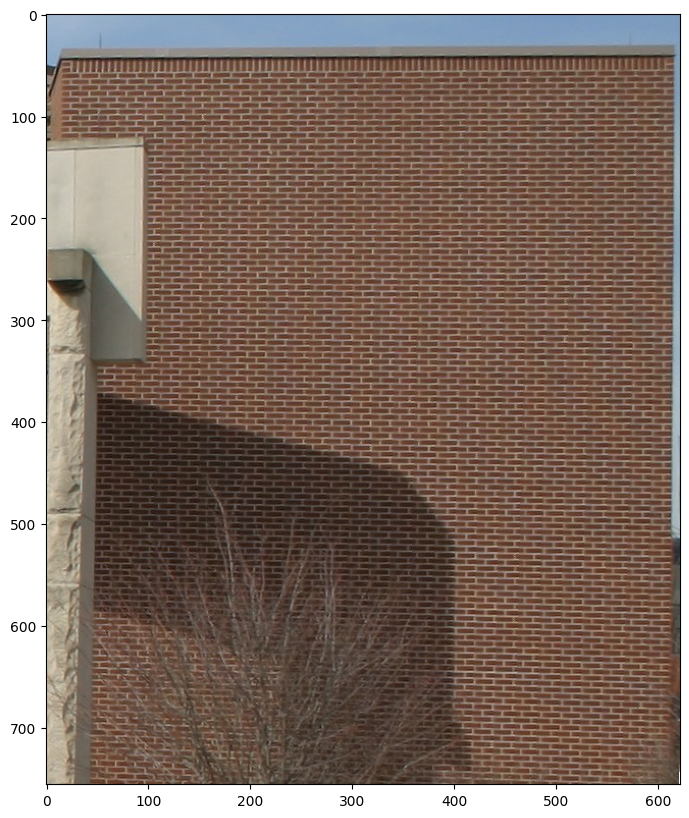

(622, 756)


In [37]:
# ngarkojme imazhin nga pathi perkates
image = Image.open("muri.png")
# lexojme imazhin dhe e shfaqim ate
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()
print(image.size)

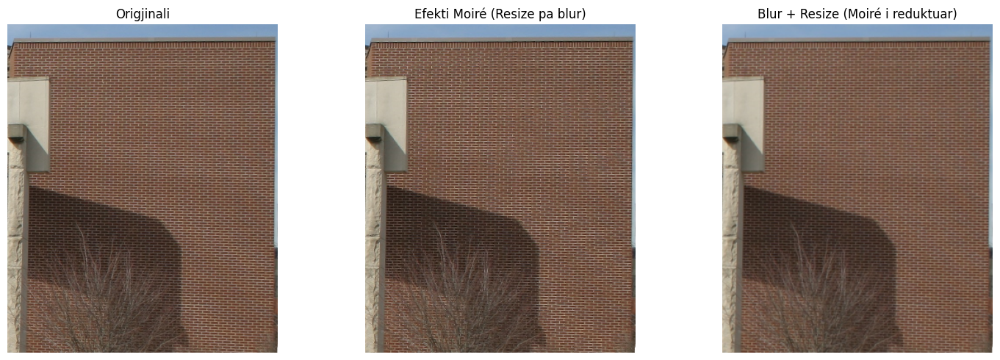

In [50]:
# Ngarko imazhin
image = Image.open("muri.png")

# (1) Origjinali
original = image.copy()

# (2) Resize pa blur (do shkaktojë moiré)
moire_effect = image.resize((image.width // 2, image.height // 2), resample=Image.NEAREST)

# (3) Blur + resize (reduktim moiré)
blurred = image.filter(ImageFilter.BoxBlur(1))

moire_reduced = blurred.resize((image.width // 2, image.height // 2), resample=Image.NEAREST)

# Shfaq rezultatet
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title("Origjinali")
plt.imshow(original)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Efekti Moiré (Resize pa blur)")
plt.imshow(moire_effect)
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Blur + Resize (Moiré i reduktuar)")
plt.imshow(moire_reduced)
plt.axis("off")

plt.tight_layout()
plt.show()


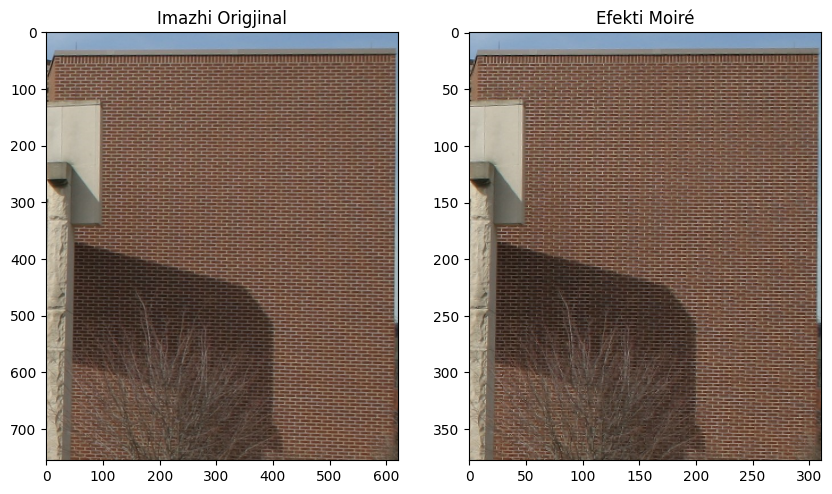

In [51]:
# efeklti moire mbi imazhin origjinal
plot_image(image, moire_effect, title_1="Imazhi Origjinal", title_2="Efekti Moiré",  gray = "no")

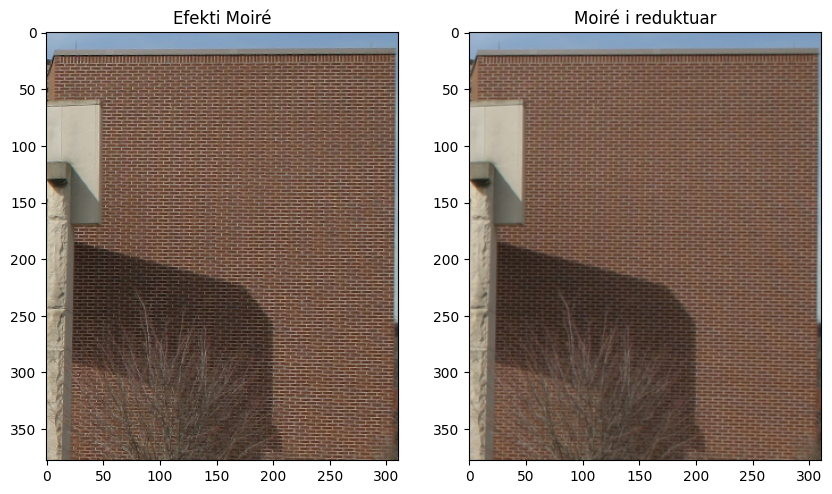

In [52]:
# Eleminimi i Efekti Moiré
plot_image(moire_effect, moire_reduced, title_1="Efekti Moiré", title_2="Moiré i reduktuar", gray = "no")

### Vetitë e TDF-së 2-D --> Spektri i Fourier-it dhe Këndi i Fazës


### ⚙️ Spektri i Fourier-it dhe Këndi i Fazës në një Imazh

#### Spektri i Fourier-it  
Spektri i Fourier-it tregon **shpërndarjen e amplitudave** të frekuencave në një imazh, domethënë **sa e fortë është çdo frekuencë**.

Spektri i amplitudës: $\quad |F(u, v)|$


#### Këndi i Fazës  
Këndi i fazës tregon **informacionin hapësinor** të frekuencave, pra **ku ndodhen strukturat** në imazh.


Këndi i fazës:
$$\quad \arg(F(u,v)) = \tan^{-1} \left( \frac{\Im(F(u,v))}{\Re(F(u,v))} \right)$$


#### Përmbledhje  
- **Spektri** përcakton *sa* është e pranishme një frekuencë.  
- **Faza** përcakton *ku* ndodhet ajo frekuencë në imazh.

> Në përpunimin e imazheve, faza mban më shumë informacion strukture se vetë amplituda.


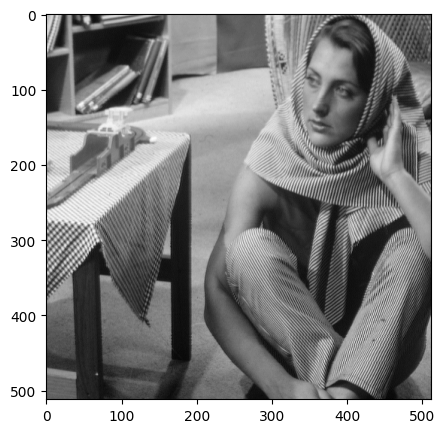

In [53]:
# Ngarko imazhin origjinal

image = Image.open("barbara.png").convert('L')  # Konvertoje në gri
image_array = np.array(image)

#printojme imazhin origjinal
plt.figure(figsize=(5, 5))
plt.imshow(image, cmap='gray')


In [56]:
# Funksion për të marrë spektrin dhe fazën

def get_spectrum_and_phase(image_array):
    # Kryejmë transformimin Fourier të imazhit
    spectrum = np.fft.fftshift(np.fft.fft2(image_array))  # FFT dhe kalimi i spektrit në qendër
    magnitude = np.abs(spectrum)  # Magnituda e spektrit
    phase = np.angle(spectrum)  # Faza e spektrit
    
    return magnitude, phase


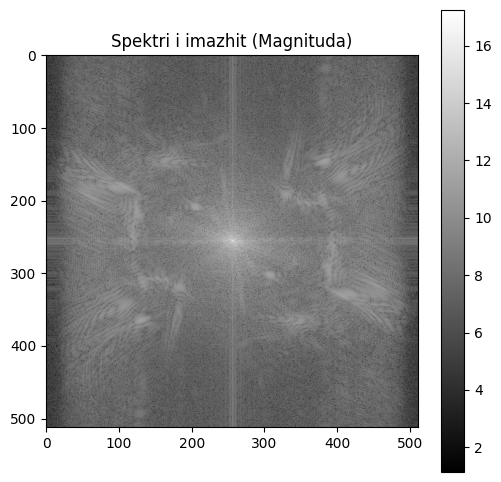

In [59]:
magnitude, phase = get_spectrum_and_phase(image_array)

# Shfaq spektrin
plt.figure(figsize=(6, 6))
plt.imshow(np.log(1 + magnitude), cmap='gray')  # Përdor logaritmin për të përmirësuar vizualizimin
plt.colorbar()
plt.title('Spektri i imazhit (Magnituda)')
plt.show()


Text(0.5, 1.0, 'Këndi i fazës')

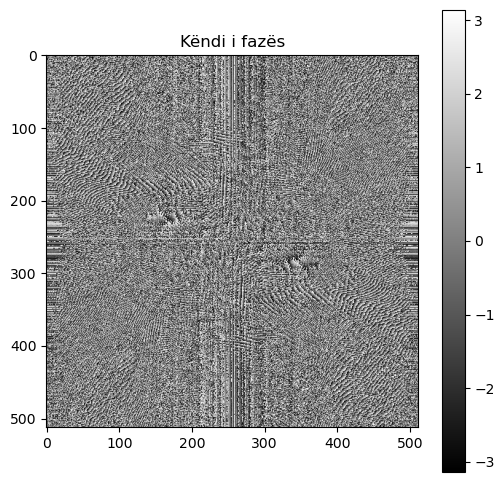

In [16]:
# Këndi i fazës
plt.figure(figsize=(6, 6))
plt.imshow(phase, cmap='gray')
plt.colorbar()
plt.title('Këndi i fazës')


Text(0.5, 1.0, 'Këndi i fazës')

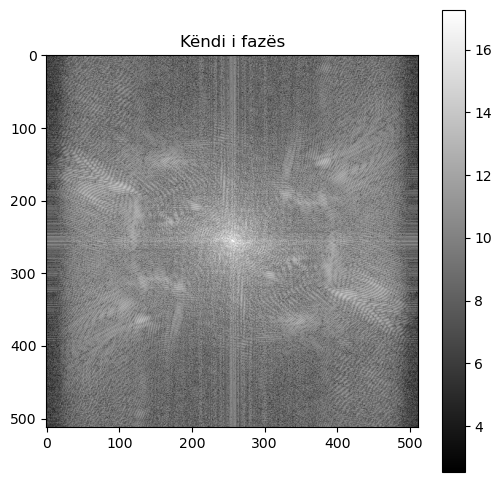

In [17]:
# Këndi i fazës dhe spektri
plt.figure(figsize=(6, 6))
plt.imshow(np.abs(phase) + np.log(1 + magnitude), cmap='gray')
plt.colorbar()
plt.title('Këndi i fazës')


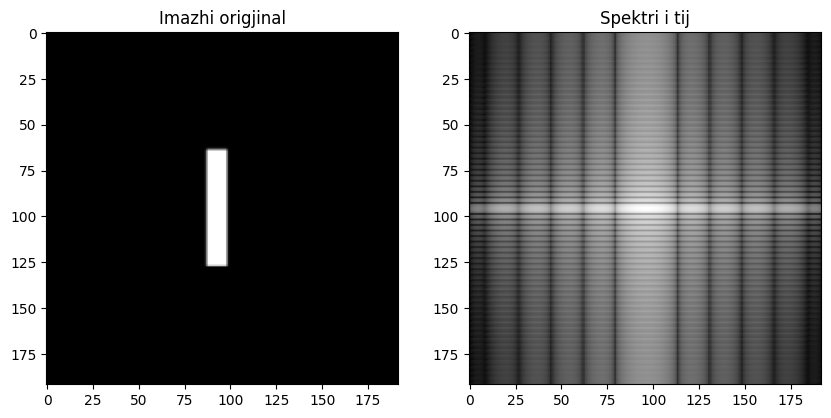

In [60]:
# Ngarko imazhin origjinal
imd = Image.open("drejtkendesh.png").convert('L')  # Konvertoje në gri
image_array2 = np.array(imd)

magnitude_d, phase_d = get_spectrum_and_phase(image_array2)
# imazhi drejtkendesh per orjentim spektri dhe spektri i tij
plot_image(image_array2, np.log(1 + magnitude_d), title_1="Imazhi origjinal", title_2="Spektri i tij", gray = "yes")


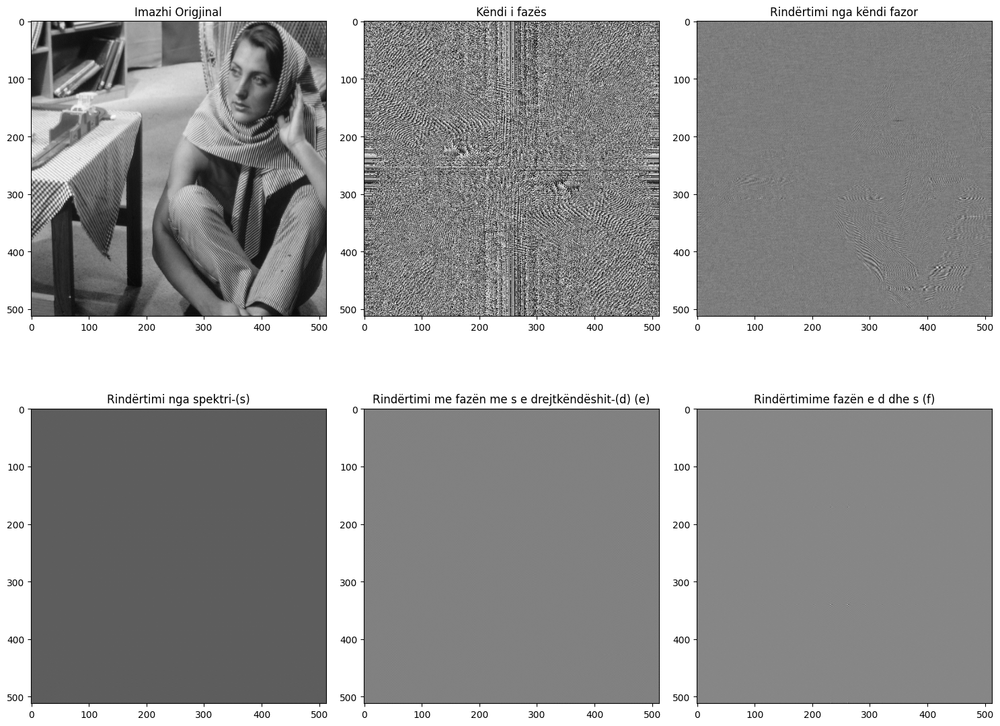

In [63]:
# Merr spektrin dhe fazën e imazhit origjinal
magnitude, phase = get_spectrum_and_phase(image_array)

# (a) Imazhi Origjinal
plt.figure(figsize=(15, 12))
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Imazhi Origjinal')

# (b) Këndi i fazës
plt.subplot(2, 3, 2)
plt.imshow(phase, cmap='gray', vmin=-np.pi, vmax=np.pi)
plt.title('Këndi i fazës')

# (c) Gruaja e rindërtuar duke përdorur vetëm këndin fazor
# Rindërtojmë imazhin duke përdorur vetëm fazën, dhe magnitudën origjinale
reconstructed_phase_only = np.fft.ifft2(np.exp(1j * phase)).real
plt.subplot(2, 3, 3)
plt.imshow(reconstructed_phase_only, cmap='gray')
plt.title('Rindërtimi nga këndi fazor')

# (d) Gruaja e rindërtuar duke përdorur vetëm spektrin
# Rindërtojmë imazhin duke përdorur vetëm magnitudën, dhe fazën origjinale
reconstructed_magnitude_only = np.fft.ifft2(magnitude * np.exp(1j * np.zeros_like(phase))).real
plt.subplot(2, 3, 4)
plt.imshow(reconstructed_magnitude_only, cmap='gray')
plt.title('Rindërtimi nga spektri-(s)')

# (e) Rindërtimi duke përdorur këndin fazor që korrespondon me gruan dhe spektrin që korrespondon me imazhin e cameramanit
cmeraman_image = Image.open("drejtkendesh.png")
# Resize imazhin e cameraman për të pasur dimensionet e njëjta si imazhi origjinal (barbara.png)
cmeraman_image = cmeraman_image.resize(image.size, resample=Image.Resampling.NEAREST)

# Konverto imazhin në tonalitete gri dhe ktheje në array NumPy
cmeraman_image = np.array(cmeraman_image.convert('L'))

# Merr spektrin dhe fazën e imazhit të cameraman
rect_magnitude, rect_phase = get_spectrum_and_phase(cmeraman_image)

# Rindërto me fazën e gruas dhe spektrin e drejtkëndëshit
reconstructed_mixed = np.fft.ifft2(rect_magnitude * np.exp(1j * phase)).real
plt.subplot(2, 3, 5)
plt.imshow(reconstructed_mixed, cmap='gray')
plt.title('Rindërtimi me fazën me s e drejtkëndëshit-(d) (e)')

# (f) Rindërtimi duke përdorur fazën e drejtkëndëshit dhe spektrin e gruas
reconstructed_mixed_2 = np.fft.ifft2(magnitude * np.exp(1j * rect_phase)).real
plt.subplot(2, 3, 6)
plt.imshow(reconstructed_mixed_2, cmap='gray')
plt.title('Rindërtimime fazën e d dhe s (f)')

# Shfaq grafikun
plt.tight_layout()
plt.show()

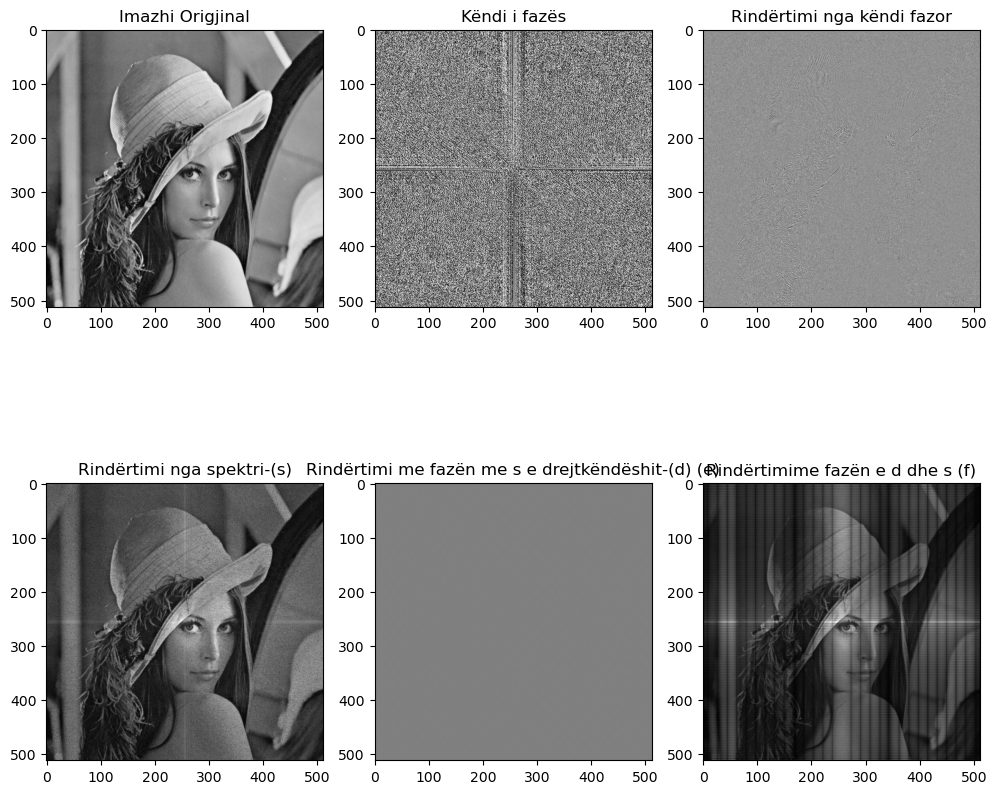

In [91]:
# (a) Imazhi Origjinal
plt.figure(figsize=(10, 10))
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Imazhi Origjinal')

# (b) Këndi i fazës

plt.subplot(2, 3, 2)
plt.imshow(phase, cmap='gray')
plt.title('Këndi i fazës')

# (c) Gruaja e rindërtuar duke përdorur vetëm këndin fazor
# Rindërtojmë imazhin duke përdorur vetëm fazën, dhe magnitudën origjinale
reconstructed_phase_only = np.fft.ifft2(np.exp(1j * phase)).real
plt.subplot(2, 3, 3)
plt.imshow(reconstructed_phase_only, cmap='gray')
plt.title('Rindërtimi nga këndi fazor')

# (d) Gruaja e rindërtuar duke përdorur vetëm spektrin
# Rindërtojmë imazhin duke përdorur vetëm magnitudën, dhe fazën origjinale
reconstructed_magnitude_only = np.fft.ifft2(magnitude * np.exp(1j * np.zeros_like(phase))).real
imm = np.log(1 + magnitude)* image_array
plt.subplot(2, 3, 4)#reconstructed_magnitude_only
plt.imshow(imm, cmap='gray')
plt.title('Rindërtimi nga spektri-(s)')

# (e) Rindërtimi duke përdorur këndin fazor që korrespondon me gruan dhe spektrin që korrespondon me imazhin e cameramanit
#"cameraman.jpeg"
cmeraman_image = Image.open("drejtkendesh.png")
# Resize imazhin e cameraman për të pasur dimensionet e njëjta si imazhi origjinal (barbara.png)
cmeraman_image = cmeraman_image.resize(image.size, resample=Image.Resampling.NEAREST)

# Konverto imazhin në tonalitete gri dhe ktheje në array NumPy
cmeraman_image = np.array(cmeraman_image.convert('L'))

# Merr spektrin dhe fazën e imazhit të cameraman
rect_magnitude, rect_phase = get_spectrum_and_phase(cmeraman_image)

# Rindërto me fazën e gruas dhe spektrin e drejtkëndëshit
reconstructed_mixed = np.fft.ifft2(rect_magnitude * np.exp(1j * phase)).real
plt.subplot(2, 3, 5)
plt.imshow(reconstructed_mixed, cmap='gray')
plt.title('Rindërtimi me fazën me s e drejtkëndëshit-(d) (e)')

# (f) Rindërtimi duke përdorur fazën e drejtkëndëshit dhe spektrin e gruas
#reconstructed_mixed_2 = np.fft.ifft2(magnitude * np.exp(1j * rect_phase)).real
imi = np.log(1 + rect_magnitude)* image_array

plt.subplot(2, 3, 6)
plt.imshow(imi, cmap='gray')
plt.title('Rindërtimime fazën e d dhe s (f)')

# Shfaq grafikun
plt.tight_layout()
plt.show()

### Filtrim me zhvendosje jozero

Për të aplikuar një `filtrim me zhvendosje jozero` të fazës mbi imazhin e "Barbara", duhet të përdorim transformimin Fourier për të ndryshuar fazën e spektrit dhe pastaj ta kthejmë imazhin në hapësirën e tij origjinale.

Zhvendosja jozero e fazës do të thotë që do të modifikojmë vetëm fazën, duke lënë magnitudën e spektrit të pandryshuar, dhe pastaj do ta rikonstruktojmë imazhin.

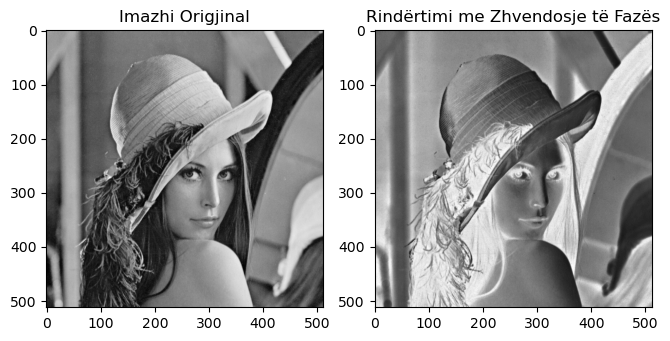

In [90]:
# Ngarko imazhin origjinal
image = Image.open("circuit.jpeg").convert('L')  # Konvertoje në tonalitete gri
image_array = np.array(image)
# Merr spektrin dhe fazën e imazhit origjinal
magnitude, phase = get_spectrum_and_phase(image_array)


# (a) Imazhi Origjinal
plt.figure(figsize=(10, 10))
plt.subplot(2, 3, 1)
plt.imshow(image_array, cmap='gray')
plt.title('Imazhi Origjinal')

# Filtrim me zhvendosje jozero e fazës (modifikimi i fazës)
# Zhvendosim fazën me një vlerë të rastësishme (p.sh. +π/4)
shifted_phase = phase + np.pi / 1

# Rindërtojmë imazhin duke përdorur magnitudën origjinale dhe fazën e ndryshuar
reconstructed_image_shifted_phase = np.fft.ifft2(np.fft.ifftshift(magnitude * np.exp(1j * shifted_phase))).real

# (b) Rindërtimi me fazën e zhvendosur
plt.subplot(2, 3, 2)
plt.imshow(reconstructed_image_shifted_phase, cmap='gray')
plt.title('Rindërtimi me Zhvendosje të Fazës')

# Shfaq grafikun
plt.tight_layout()
plt.show()

### Filtrimi ne fushen e Frekuences (hapat per kete filtrim)

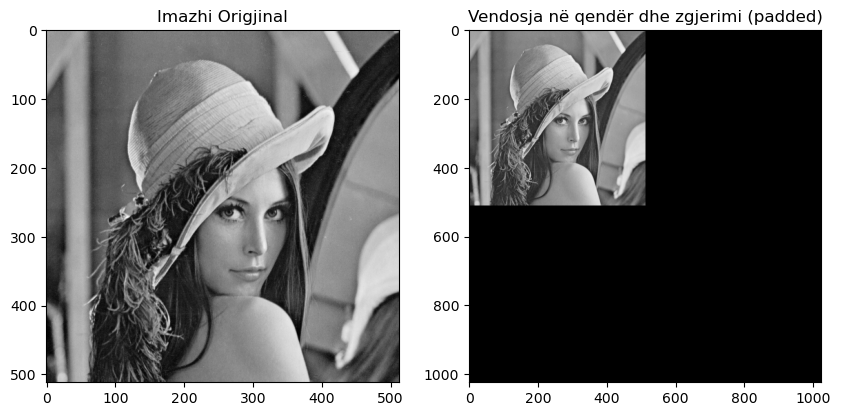

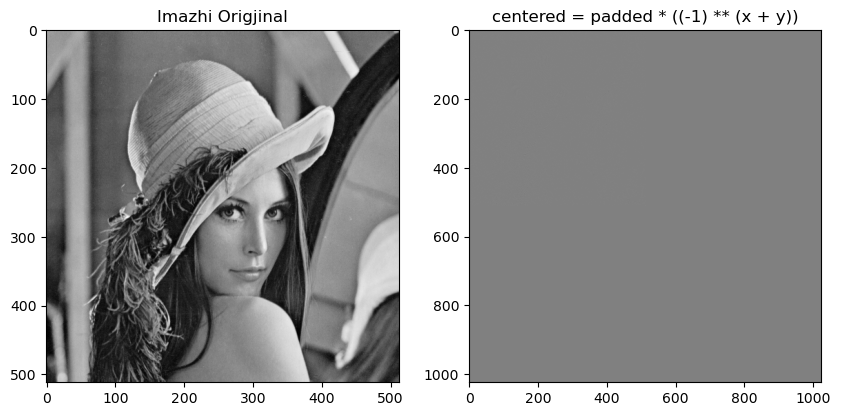

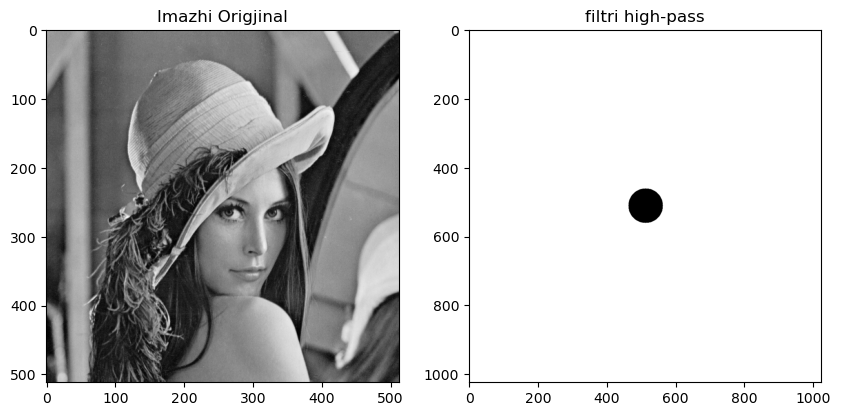

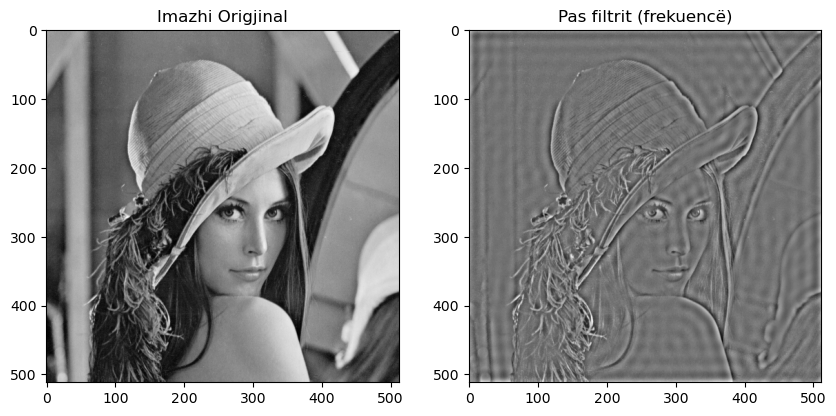

In [89]:

# Ngarkimi i imazhit në grayscale
image = Image.open("circuit.jpeg").convert("L")
image_array = np.array(image)

# Vendosja në qendër dhe zgjerimi
M, N = image_array.shape
P, Q = 2*M, 2*N
padded = np.zeros((P, Q))
padded[:M, :N] = image_array
x = np.arange(P).reshape(P, 1)
y = np.arange(Q).reshape(1, Q)
centered = padded * ((-1) ** (x + y))
# afishimi
plot_image(image_array, padded, title_1 = "Imazhi Origjinal", title_2 = "Vendosja në qendër dhe zgjerimi (padded)", gray = "yes")
plot_image(image_array, centered, title_1 = "Imazhi Origjinal", title_2 = "centered = padded * ((-1) ** (x + y))", gray = "yes")


# FFT
F_uv = np.fft.fft2(centered)

# Krijimi i filtrit high-pass
D0 = 50
u = np.arange(P).reshape(P, 1)
v = np.arange(Q).reshape(1, Q)
D = np.sqrt((u - P//2)**2 + (v - Q//2)**2)
H = np.where(D > D0, 1, 0)
# afishimi
plot_image(image_array, H, title_1 = "Imazhi Origjinal", title_2 = "filtri high-pass", gray = "yes")


# Aplikimi i filtrit
G = H * F_uv
g_xy = np.real(np.fft.ifft2(G))
g_xy = g_xy * ((-1) ** (x + y))
filtered = g_xy[:M, :N]
# afishimi i imazhit origjinal dhe atij te filtruar
plot_image(image_array, filtered, title_1 = "Imazhi Origjinal", title_2 = "Pas filtrit (frekuencë)", gray = "yes")



### Zbutja e imazhit duke përdorur filtrat ideal te kalimit të ulet: FI-KU

Për të realizuar zbutjen e imazhit duke përdorur filtrat ideal të kalimit të ulet (Low-pass Filters - LPF), duhet të kalojmë përmes disa hapave:

- Përdorim një filtrat ideal të kalimit të ulet në hapësirën e frekuencave të transformuar Fourier.

- Aplikojmë filtrin në spektrin e frekuencave të imazhit.

- Kthejmë imazhin e filtruar në hapësirën e imazhit dhe e shfaqim.

In [58]:

# Funksioni për të aplikuar filtrin ideal të kalimit të ulet

def ideal_low_pass_filter(image_array, cutoff_frequency):
    # Kryejmë transformimin Fourier të imazhit
    f_transform = np.fft.fft2(image_array)  # Aplikojmë transformimin e Fourier për të kaluar imazhin në hapësirën e frekuencave
    f_transform_shifted = np.fft.fftshift(f_transform)  # Zhvendosim spektrin në qendër, për të pozicionuar frekuencat e ulëta në qendër

    # Krijo filtrin ideal të kalimit të ulet
    rows, cols = image_array.shape  # Merrni dimensionet e imazhit (numrin e rreshtave dhe kolonave)
    crow, ccol = rows // 2, cols // 2  # Përcaktoni qendrën e spektrit (pikën ku frekuencat e ulëta janë të pozicionuara)
    filter_mask = np.zeros((rows, cols))  # Krijoni një maskë të zeze (me të gjitha vlerat 0)

    # Krijo një maskë me një rreth të bardhë që ka frekuenca të ulëta
    for i in range(rows):  # Kaloni nëpër çdo rresht të imazhit
        for j in range(cols):  # Kaloni nëpër çdo kolonë të imazhit
            # Llogaritni distancën e çdo pike nga qendra e spektrit
            if np.sqrt((i - crow)**2 + (j - ccol)**2) <= cutoff_frequency:
                filter_mask[i, j] = 1  # Vendosni vlerën 1 për frekuencat brenda një radiusi të caktuar (cutoff_frequency)

    # Aplikimi i filtrit mbi spektrin
    filtered_f_transform = f_transform_shifted * filter_mask  # Aplikoni maskën mbi spektrin, duke mbajtur vetëm frekuencat e ulëta

    # Kthejmë spektrin e filtruar në hapësirën e imazhit
    filtered_image = np.fft.ifftshift(filtered_f_transform)  # Zhvendosim spektrin përsëri për të kthyer frekuencat në pozitat e tyre origjinale
    inverse_transform = np.fft.ifft2(filtered_image)  # Aplikoni transformimin e kundërt të Fourier për të rikthyer imazhin në hapësirën e tij origjinale
    filtered_image_real = np.abs(inverse_transform)  # Merrni vetëm pjesën reale të imazhit të rikonstruktuar (transformimi mund të ketë një pjesë imagjinare)

    return filtered_image_real  # Kthejmë imazhin e filtruar


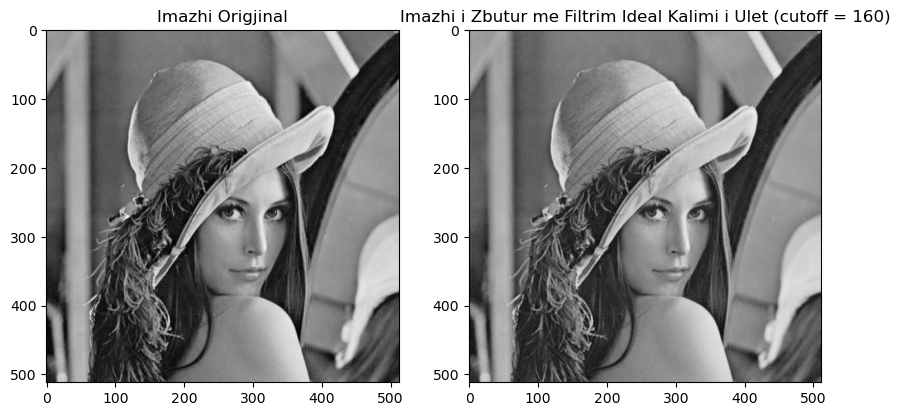

In [88]:
# Parametri i prerjes për filtrin ideal
cutoff_frequency = 160  # Zgjidhni një vlerë të prerjes për filtrin (mund të eksperimentoni)

# Aplikimi i filtrit të kalimit të ulet
filtered_image = ideal_low_pass_filter(image_array, cutoff_frequency)

# afishimi i imazhit origjinal dhe atij te filtruar
plot_image(image_array, filtered_image, title_1 = "Imazhi Origjinal", title_2 = f"Imazhi i Zbutur me Filtrim Ideal Kalimi i Ulet (cutoff = {cutoff_frequency})", gray = "yes")



### Filtrat Butterworth të Kalimit të Ulet (FB-KU)

Për të aplikuar `Filtrat Butterworth të Kalimit të Ulet (FB-KU)`, mund të përdorim një formulë për krijimin e këtij filtri. Filtrat Butterworth janë të njohur për karakteristikat e tyre të buta të kalimit dhe mund të jenë më të përshtatshëm për zbutjen e imazheve pa humbje të tepërta të informacionit.

Më poshtë implementim për Filtrat Butterworth të Kalimit të Ulet:

In [60]:

# Funksioni për të aplikuar filtrin Butterworth të kalimit të ulet
def butterworth_low_pass_filter(image_array, cutoff_frequency, order=2):
    # Kryejmë transformimin Fourier të imazhit
    f_transform = np.fft.fft2(image_array)  # Aplikojmë transformimin e Fourier për të kaluar imazhin në hapësirën e frekuencave
    f_transform_shifted = np.fft.fftshift(f_transform)  # Zhvendosim spektrin në qendër, për të pozicionuar frekuencat e ulëta në qendër

    # Krijo filtrin Butterworth të kalimit të ulet
    rows, cols = image_array.shape  # Merrni dimensionet e imazhit
    crow, ccol = rows // 2, cols // 2  # Përcaktoni qendrën e spektrit (pikën ku frekuencat e ulëta janë të pozicionuara)

    # Krijo një maskë për filtrim Butterworth
    filter_mask = np.zeros((rows, cols))  # Krijoni një maskë të zeze (me të gjitha vlerat 0)
    
    # Krijo filtrin Butterworth
    for i in range(rows):
        for j in range(cols):
            D = np.sqrt((i - crow)**2 + (j - ccol)**2)  # Llogaritni distancën nga qendra e spektrit
            filter_mask[i, j] = 1 / (1 + (D / cutoff_frequency)**(2 * order))  # Formula për filtrin Butterworth

    # Aplikimi i filtrit mbi spektrin
    filtered_f_transform = f_transform_shifted * filter_mask  # Aplikoni maskën mbi spektrin

    # Kthejmë spektrin e filtruar në hapësirën e imazhit
    filtered_image = np.fft.ifftshift(filtered_f_transform)  # Zhvendosim spektrin përsëri për të kthyer frekuencat në pozitat e tyre origjinale
    inverse_transform = np.fft.ifft2(filtered_image)  # Aplikoni transformimin e kundërt të Fourier për të rikthyer imazhin
    filtered_image_real = np.abs(inverse_transform)  # Merrni vetëm pjesën reale të imazhit të rikonstruktuar

    return filtered_image_real  # Kthejmë imazhin e filtruar


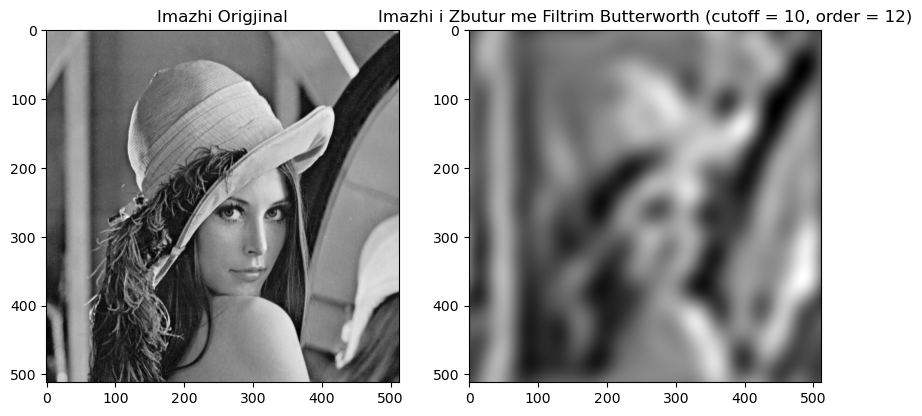

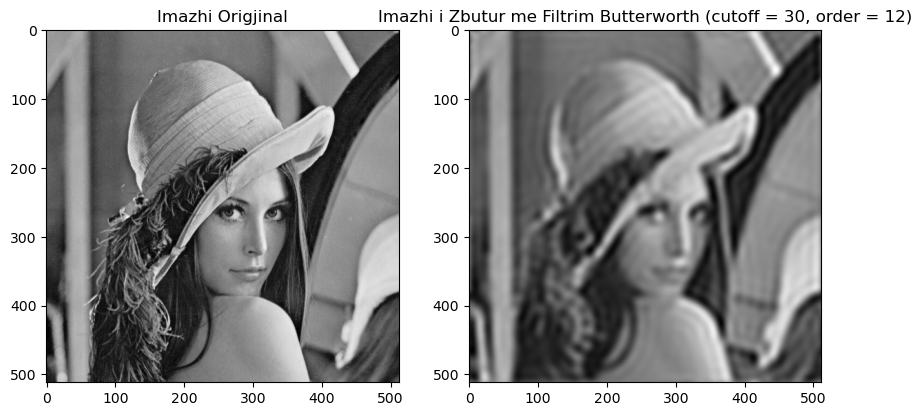

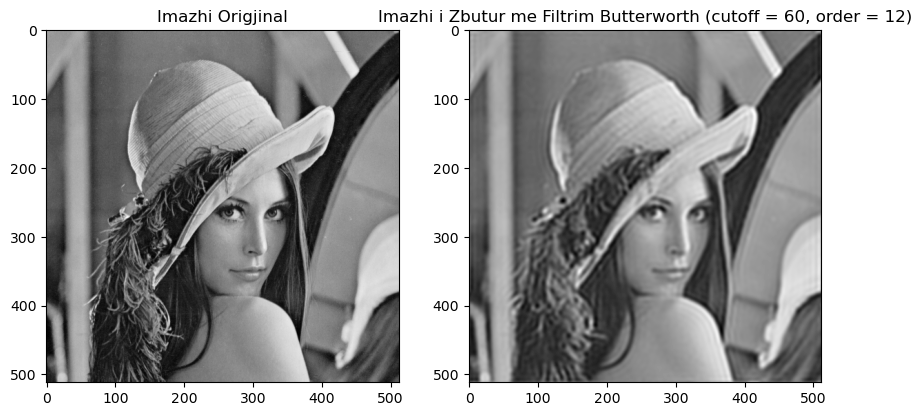

In [87]:

# Parametri i prerjes për filtrin Butterworth
cutoff_frequency = 10  # Zgjidhni një vlerë të prerjes për filtrin
order = 12  # Renditja e filtrit Butterworth

# Aplikimi i filtrit Butterworth të kalimit të ulet
filtered_image_butterworth = butterworth_low_pass_filter(image_array, cutoff_frequency, order)


# Afishojmë të dy imazhet
plot_image(image_array, filtered_image_butterworth, title_1="Imazhi Origjinal", title_2=f"Imazhi i Zbutur me Filtrim Butterworth (cutoff = {cutoff_frequency}, order = {order})", gray="yes")
#------------------------------------------------

# Parametri i prerjes për filtrin Butterworth
cutoff_frequency = 30  # Zgjidhni një vlerë të prerjes për filtrin
order = 12  # Renditja e filtrit Butterworth

# Aplikimi i filtrit Butterworth të kalimit të ulet
filtered_image_butterworth = butterworth_low_pass_filter(image_array, cutoff_frequency, order)


# Afishojmë të dy imazhet
plot_image(image_array, filtered_image_butterworth, title_1="Imazhi Origjinal", title_2=f"Imazhi i Zbutur me Filtrim Butterworth (cutoff = {cutoff_frequency}, order = {order})", gray="yes")
#--------------------

cutoff_frequency = 60  # Zgjidhni një vlerë të prerjes për filtrin
order = 12  # Renditja e filtrit Butterworth

# Aplikimi i filtrit Butterworth të kalimit të ulet
filtered_image_butterworth = butterworth_low_pass_filter(image_array, cutoff_frequency, order)


# Afishojmë të dy imazhet
plot_image(image_array, filtered_image_butterworth, title_1="Imazhi Origjinal", title_2=f"Imazhi i Zbutur me Filtrim Butterworth (cutoff = {cutoff_frequency}, order = {order})", gray="yes")
#--------------------


### Zbutjen e Imazhit duke përdorur Filtrat Gausian të Kalimit të Ulet (FG-KU),

In [62]:

# Funksioni për të aplikuar filtrin Gaussian të kalimit të ulët
def gaussian_low_pass_filter(image_array, cutoff_frequency):
    # Kryejmë transformimin Fourier të imazhit
    f_transform = np.fft.fft2(image_array)  # Aplikoni transformimin Fourier
    f_transform_shifted = np.fft.fftshift(f_transform)  # Zhvendosim spektrin në qendër

    # Krijo filtrin Gaussian
    rows, cols = image_array.shape  # Merrni dimensionet e imazhit
    crow, ccol = rows // 2, cols // 2  # Qendra e spektrit
    x = np.arange(0, rows) - crow
    y = np.arange(0, cols) - ccol
    X, Y = np.meshgrid(x, y)
    distance = np.sqrt(X**2 + Y**2)
    
    # Filtri Gaussian, e bazuar në distancën nga qendra e spektrit
    gaussian_filter_mask = np.exp(-(distance**2) / (2 * (cutoff_frequency**2)))

    # Sigurohemi që dimensionet e maskës përputhen me ato të spektrit
    gaussian_filter_mask = np.resize(gaussian_filter_mask, (rows, cols))  # Zgjeroni maskën për të përputhur dimensionet
    
    # Aplikoni filtrin mbi spektrin
    filtered_f_transform = f_transform_shifted * gaussian_filter_mask

    # Kthejmë spektrin e filtruar në hapësirën e imazhit
    filtered_image = np.fft.ifftshift(filtered_f_transform)  # Zhvendosim spektrin përsëri
    inverse_transform = np.fft.ifft2(filtered_image)  # Aplikoni transformimin e kundërt
    filtered_image_real = np.abs(inverse_transform)  # Merrni pjesën reale të imazhit të filtruar

    return filtered_image_real


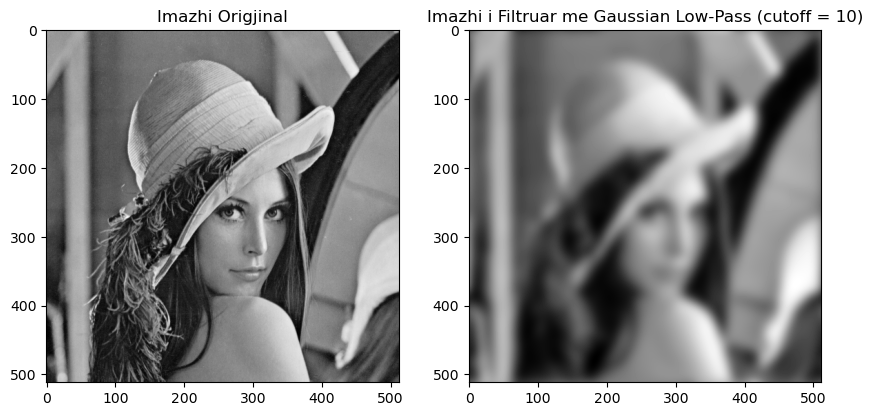

In [86]:

# Parametri i prerjes për filtrin Gaussian
cutoff_frequency = 10  # Vlera për frekuencën e prerjes

# Aplikimi i filtrit Gaussian të kalimit të ulët
filtered_image = gaussian_low_pass_filter(image_array, cutoff_frequency)

# Tregoni imazhin origjinal dhe atë të filtruar
plot_image(image_array, filtered_image, title_1="Imazhi Origjinal", title_2=f"Imazhi i Filtruar me Gaussian Low-Pass (cutoff = {cutoff_frequency})", gray = "yes")


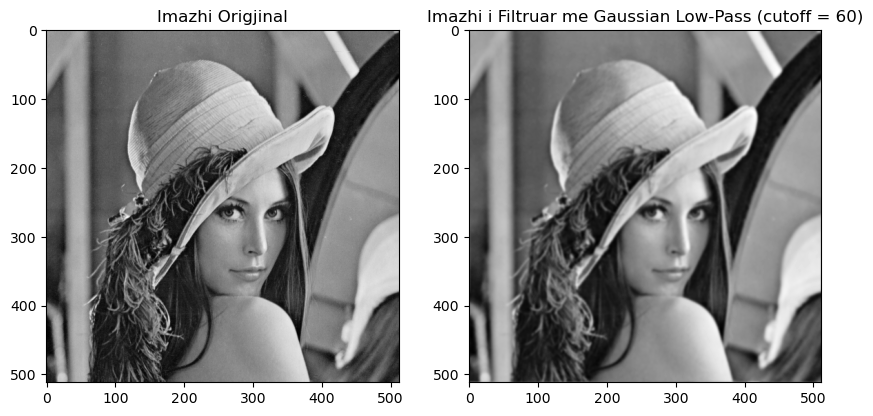

In [85]:

# Parametri i prerjes për filtrin Gaussian
cutoff_frequency = 60  # Vlera për frekuencën e prerjes

# Aplikimi i filtrit Gaussian të kalimit të ulët
filtered_image = gaussian_low_pass_filter(image_array, cutoff_frequency)

# Tregoni imazhin origjinal dhe atë të filtruar
plot_image(image_array, filtered_image, title_1="Imazhi Origjinal", title_2=f"Imazhi i Filtruar me Gaussian Low-Pass (cutoff = {cutoff_frequency})", gray = "yes")


### Filtri 2D Ideal i Kalimit të Lartë (FI-KL)

`Filtri 2D Ideal i Kalimit të Lartë (FI-KL)` mund të implementohet në mënyrë të ngjashme me filtrin ideal të kalimit të ulët (ILP), por duke invertuar maskën për të mbajtur vetëm frekuencat e larta dhe duke hequr ato të ulët.

Ja si mund ta aplikosh filtrin 2D Ideal të Kalimit të Lartë për një imazh:

Një filtër me kalim të lartë merret nga një filtër i caktuar me kalim të ulët duke përdorur
:

$$
H_{HP}(f) = 1 - H_{LP}(f)
$$

Kjo tregon se një filtri i kalimit të lartë $H_{HP}(f)$ mund të krijohet duke zbritur filtrin e kalimit të ulët $H_{LP}(f)$ nga 1.

In [66]:

# Funksioni për të aplikuar filtrin ideal të kalimit të lartë nga filtri i kalimit të ulët
def ideal_high_pass_filter_from_low_pass(image_array, cutoff_frequency):
    # Aplikoni filtri ideal të kalimit të ulët
    low_pass_image = ideal_low_pass_filter(image_array, cutoff_frequency)
    
    # Subtrahi filtrin e kalimit të ulët nga imazhi origjinal për të krijuar filtrin e kalimit të lartë
    high_pass_image = image_array - low_pass_image
    
    return high_pass_image

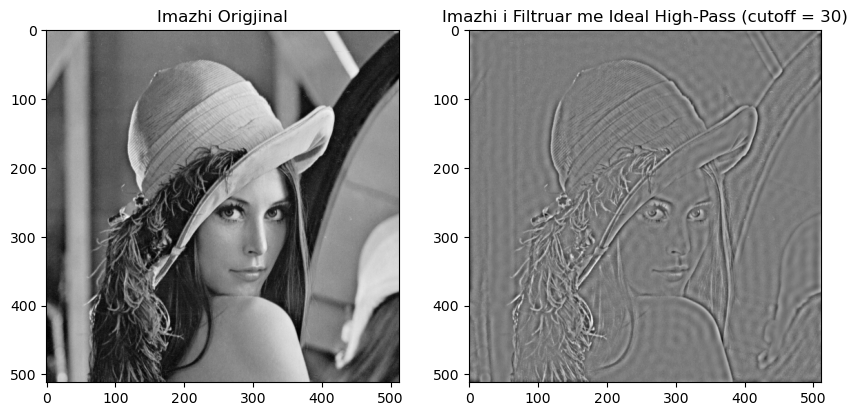

In [84]:

# Parametri i prerjes për filtrin Ideal të kalimit të lartë
cutoff_frequency = 30  # Vlera për frekuencën e prerjes

# Aplikimi i filtrit Ideal të kalimit të lartë
filtered_image = ideal_high_pass_filter_from_low_pass(image_array, cutoff_frequency)

# Tregoni imazhin origjinal dhe atë të filtruar
plot_image(image_array , filtered_image, title_1="Imazhi Origjinal", title_2=f"Imazhi i Filtruar me Ideal High-Pass (cutoff = {cutoff_frequency})", gray = "yes")


### Filter 2-D Butterworth i Kalimit te (FB-KL)

In [68]:

# Funksioni për të aplikuar filtrin ideal të kalimit të lartë nga filtri i kalimit të ulët
def FBKL_from_low_pass(image_array, cutoff_frequency):
    # Aplikoni filtri ideal të kalimit të ulët
    low_pass_image = butterworth_low_pass_filter(image_array, cutoff_frequency)
    
    # Subtrahi filtrin e kalimit të ulët nga imazhi origjinal për të krijuar filtrin e kalimit të lartë
    high_pass_image = image_array - low_pass_image
    
    return high_pass_image

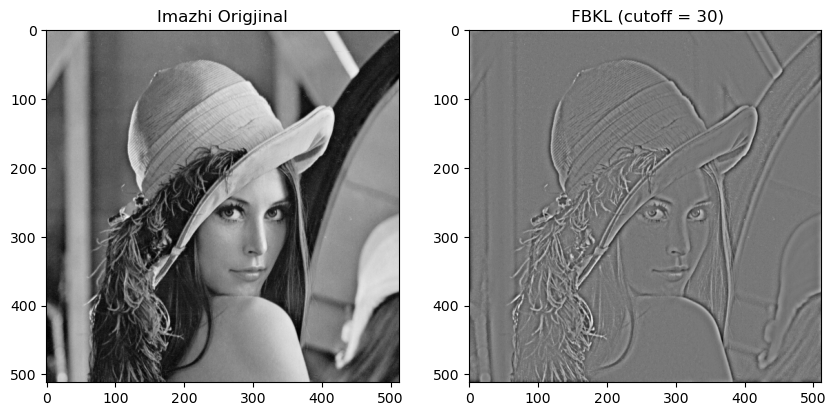

In [83]:

# Parametri i prerjes për filtrin Ideal të kalimit të lartë
cutoff_frequency = 30  # Vlera për frekuencën e prerjes

# Aplikimi i filtrit Ideal të kalimit të lartë
filtered_image = FBKL_from_low_pass(image_array, cutoff_frequency)

# Tregoni imazhin origjinal dhe atë të filtruar
plot_image(image_array , filtered_image, title_1="Imazhi Origjinal", title_2=f" FBKL (cutoff = {cutoff_frequency})", gray = "yes")


### Filter 2-D Gaussian i Kalimit te Larte (FG-KL)

In [70]:

# Funksioni për të aplikuar filtrin ideal të kalimit të lartë nga filtri i kalimit të ulët
def FGKL_from_low_pass(image_array, cutoff_frequency):
    # Aplikoni filtri ideal të kalimit të ulët
    low_pass_image = gaussian_low_pass_filter(image_array, cutoff_frequency)
    
    # Subtrahi filtrin e kalimit të ulët nga imazhi origjinal për të krijuar filtrin e kalimit të lartë
    high_pass_image = image_array - low_pass_image
    
    return high_pass_image

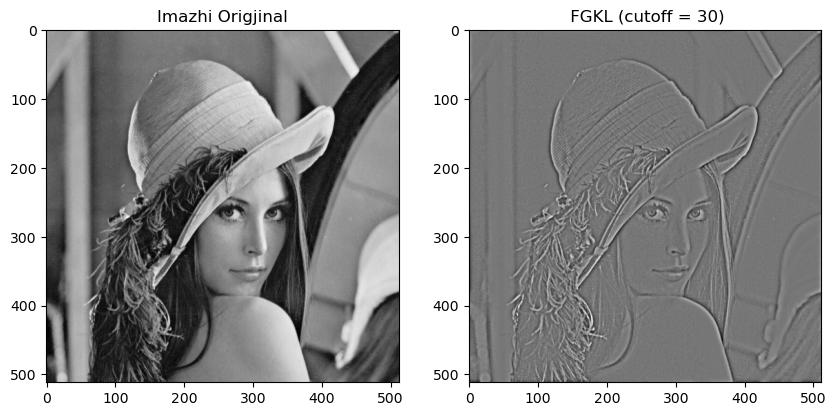

In [82]:

# Parametri i prerjes për filtrin Ideal të kalimit të lartë
cutoff_frequency = 30  # Vlera për frekuencën e prerjes

# Aplikimi i filtrit Ideal të kalimit të lartë
filtered_image = FGKL_from_low_pass(image_array, cutoff_frequency)

# Tregoni imazhin origjinal dhe atë të filtruar
plot_image(image_array , filtered_image, title_1="Imazhi Origjinal", title_2=f" FGKL (cutoff = {cutoff_frequency})", gray = "yes")


## Filtrit Laplasian në hapësirën e frekuencës

`Filtri Laplasian` në hapësirën e frekuencës përdoret për të nxjerrë në pah konturet dhe detajet e imazheve duke zbatuar një operator të derivimit të dytë në `spektrin e Fourier-it`.

Ky filtrim thekson ndryshimet e shpejta të intensitetit dhe përdoret zakonisht për përmirësimin e skajeve ose mprehjen e imazheve të mjegulluara. Në këtë metodë, transformimi Fourier i imazhit shumëzohet me një funksion që korrespondon me operatorin Laplasian në fushën e frekuencave.

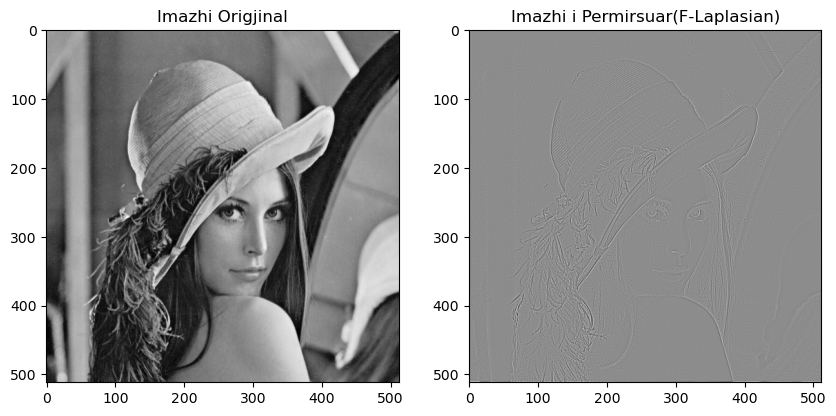

In [81]:

image_array = np.array(image)

# Aplikimi i transformimit Fourier
f_transform = np.fft.fft2(image_array)
f_transform_shifted = np.fft.fftshift(f_transform)

# Krijimi i filtrit Laplacian në fushën e frekuencave
rows, cols = image_array.shape
u = np.arange(-cols//2, cols//2)
v = np.arange(-rows//2, rows//2)
U, V = np.meshgrid(u, v)
laplacian_filter = -4 * (np.pi ** 2) * (U**2 + V**2)

# Aplikimi i filtrit Laplacian
filtered_spectrum = f_transform_shifted * laplacian_filter

# Rikthimi në hapësirën e pikselave
filtered_shifted_back = np.fft.ifftshift(filtered_spectrum)
filtered_image = np.fft.ifft2(filtered_shifted_back)
filtered_image = np.real(filtered_image)

# Normalizimi i imazhit për ta shfaqur
filtered_image = (filtered_image - filtered_image.min()) / (filtered_image.max() - filtered_image.min()) * 255
filtered_image = filtered_image.astype(np.uint8)

# Shfaqja e rezultateve

plot_image(image_array , filtered_image, title_1="Imazhi Origjinal", title_2= "Imazhi i Permirsuar(F-Laplasian)", gray = "yes")


### Filtrimi Homomorf

**Filtrimi homomorf** është një teknikë për përmirësimin e kontrastit dhe ndriçimit të imazheve duke ndarë përbërësit ndriçues dhe reflektues në fushën e frekuencës.



In [73]:

import cv2

# Funksioni qe realizon filtrimi 
def homomorphic_filter(image_array, gamma_l=0.5, gamma_h=2.0, c=1, d0=30):
    # 1. Logaritmo imazhin
    image_log = np.log1p(np.array(image_array, dtype="float"))

    # 2. Transformimi Fourier dhe zhvendosja në qendër
    dft = np.fft.fft2(image_log)
    dft_shift = np.fft.fftshift(dft)

    # 3. Krijimi i filtrit homomorf
    rows, cols = image_array.shape
    u = np.arange(rows)
    v = np.arange(cols)
    U, V = np.meshgrid(u - rows//2, v - cols//2, indexing='ij')
    D = np.sqrt(U**2 + V**2)
    H = (gamma_h - gamma_l) * (1 - np.exp(-c * (D**2 / (d0**2)))) + gamma_l

    # 4. Aplikimi i filtrit
    filtered_dft = H * dft_shift

    # 5. Rikthimi në hapësirën e pikselave
    dft_inverse_shift = np.fft.ifftshift(filtered_dft)
    img_back = np.fft.ifft2(dft_inverse_shift)
    img_back = np.exp(np.real(img_back)) - 1

    # 6. Normalizimi për shfaqje
    img_back = np.uint8(np.clip((img_back / img_back.max()) * 255, 0, 255))

    return img_back


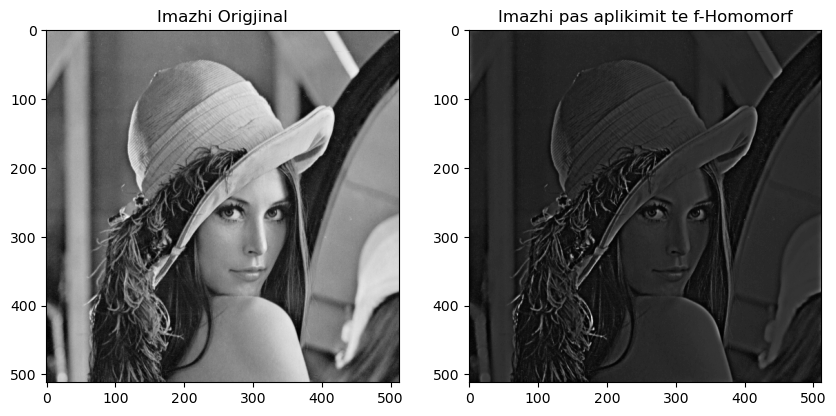

In [80]:

# Ngarko imazhin me Pillow dhe kthejm ate në grayscale
image = Image.open('lenna.png').convert('L')
image_array = np.array(image)

# Apliko filtrin homomorf
filtered_image = homomorphic_filter(image_array, gamma_l=0.6, gamma_h=2.2, c=1, d0=30)
# (kemi dhen vlera te caktuara parametrave: ps:ju mund te zgjidhni te tjere)
# Shfaqja e rezultateve

plot_image(image_array , filtered_image, title_1="Imazhi Origjinal", title_2= "Imazhi pas aplikimit te f-Homomorf", gray = "yes")


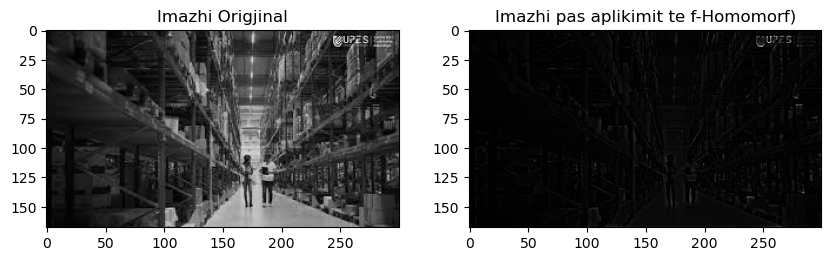

In [79]:

# Ngarko imazhin me Pillow dhe kthejm ate në grayscale
image = Image.open('depo.jpeg').convert('L')
image_array = np.array(image)

# Apliko filtrin homomorf
filtered_image = homomorphic_filter(image_array, gamma_l=0.6, gamma_h=2.2, c=1, d0=30)
# (kemi dhen vlera te caktuara parametrave: ps:ju mund te zgjidhni te tjere)
# Shfaqja e rezultateve

plot_image(image_array , filtered_image, title_1="Imazhi Origjinal", title_2= "Imazhi pas aplikimit te f-Homomorf)", gray = "yes")


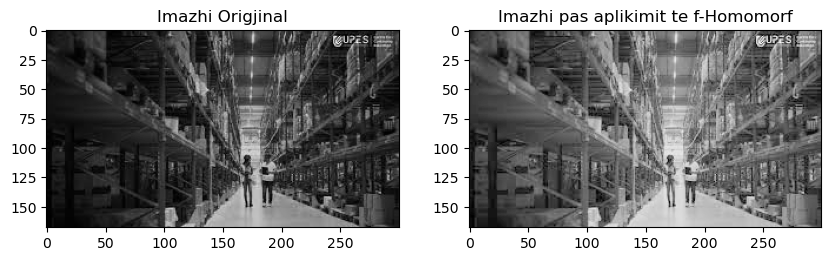

In [78]:
# Apliko filtrin homomorf
filtered_image = homomorphic_filter(image_array, gamma_l=0.6, gamma_h=0.5, c=50, d0=1)
# (kemi dhen vlera te caktuara parametrave: ps:ju mund te zgjidhni te tjere)
# Shfaqja e rezultateve

plot_image(image_array , filtered_image, title_1="Imazhi Origjinal", title_2= "Imazhi pas aplikimit te f-Homomorf", gray = "yes")


# Referenca

[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).

[5 ] Jian, Wushuai, Xueyan Sun, and Shuqian Luo. "Computer-aided diagnosis of breast microcalcifications based on dual-tree complex wavelet transform." Biomedical engineering online 11.1 (2012): 1-12.


<h3 align="center"> &#169; UMT. All rights reserved. <h3/>
    <h3 align="center"> anxheloshehu@umt.edu.al <h3/>

**Ushtrim 1:**
Duke perdorur filtrat e mesiperm dhe nje (ose disa) imazhe kartmonedhash te ndryshme, te percaktohen detajet e ndryshme qe mund te nxjerrin filtrat e mesiperm.
- Percaktoni se cili prej tipve(Filtra te kalimit te ulet- Filtra te kalimit te larte i nxjerr keto detaje).

**Ushtrim 2:**
- shkarkoni nje imazh MRI te trurit ku kemi prezenc te kancerit dhe nje ku nuk kemi prezenc te kancerit. 
- Apliko Filtrat ne fushen e hapsires(seminari i kaluar) ose te frekuences, dhe analizo histogramat e tyre.
- Identifiko cili prej ketyre filtrave siguron diferenc makimale midis ketyre imazheve te te njejtit tip.
###### (a mund te jet diferenca midis histogramave pas plikimit te filtrave nje metod e mire per parashikimin e malinjitetit ne tru?)